In [2]:
import pyforest

import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_excel('compactiv.xlsx')

df.head()

<IPython.core.display.Javascript object>

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.shape

(8192, 22)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

* Type of data features
    - Float - 13
    - Int - 8
    - Object - 1
* Few null values in features,
    - rchar (105)
    - wchar (15)

In [6]:
df.isna().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [7]:
df[df.duplicated()]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr


* No Duplicate entries in the data

In [8]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,19.56,53.35,0.0,2.0,7.0,20.00,1845.00
lwrite,8192.0,13.11,29.89,0.0,0.0,1.0,10.00,575.00
scall,8192.0,2306.32,1633.62,109.0,1012.0,2051.5,3317.25,12493.00
sread,8192.0,210.48,198.98,6.0,86.0,166.0,279.00,5318.00
swrite,8192.0,150.06,160.48,7.0,63.0,117.0,185.00,5456.00
fork,8192.0,1.88,2.48,0.0,0.4,0.8,2.20,20.12
exec,8192.0,2.79,5.21,0.0,0.2,1.2,2.80,59.56
rchar,8088.0,197385.73,239837.49,278.0,34091.5,125473.5,267828.75,2526649.00
wchar,8177.0,95902.99,140841.71,1498.0,22916.0,46619.0,106101.00,1801623.00
pgout,8192.0,2.29,5.31,0.0,0.0,0.0,2.40,81.44


* Data Description on all features - 
    - Mean and Median values for all columns vary drastically, which alerts for outliers in the dataset.
    - Few columns like *pgout, ppgout, pgfree, pgscan, atch* do have lots of 0 values in the data. Around 50% of the data is having value 0.
    - All features are on different scales, we should perform scaling before doing modelling.
    - Target feature *usr* has almost close values for Mean and Median. We can expect graph like normal distribution with a small left tail.
    - There are missing values in the dataset, which are needed to be imputed before modelling.
    - Object column - *runqsz* has only 2 unique values, which seems to be right without any bad data.

In [9]:
df.describe(include='object').T

,count,unique,top,freq
runqsz,8192,2,Not_CPU_Bound,4331


In [10]:
df.nunique()

lread        235
lwrite       189
scall       4115
sread        794
swrite       640
fork         228
exec         386
rchar       7898
wchar       7925
pgout        404
ppgout       774
pgfree      1070
pgscan      1202
atch         253
pgin         832
ppgin       1072
pflt        2987
vflt        3799
runqsz         2
freemem     3165
freeswap    7658
usr           56
dtype: int64

In [11]:
num_cols = df.columns.to_list()
num_cols.remove('runqsz')
cat_cols = ['runqsz']
num_cols

['lread',
 'lwrite',
 'scall',
 'sread',
 'swrite',
 'fork',
 'exec',
 'rchar',
 'wchar',
 'pgout',
 'ppgout',
 'pgfree',
 'pgscan',
 'atch',
 'pgin',
 'ppgin',
 'pflt',
 'vflt',
 'freemem',
 'freeswap',
 'usr']

### Visualization

In [12]:
from vizad.univariate import plot_univariate_categorical, plot_univariate_numeric
from vizad.bivariate import plot_bivariate_categorical, plot_bivariate_numeric

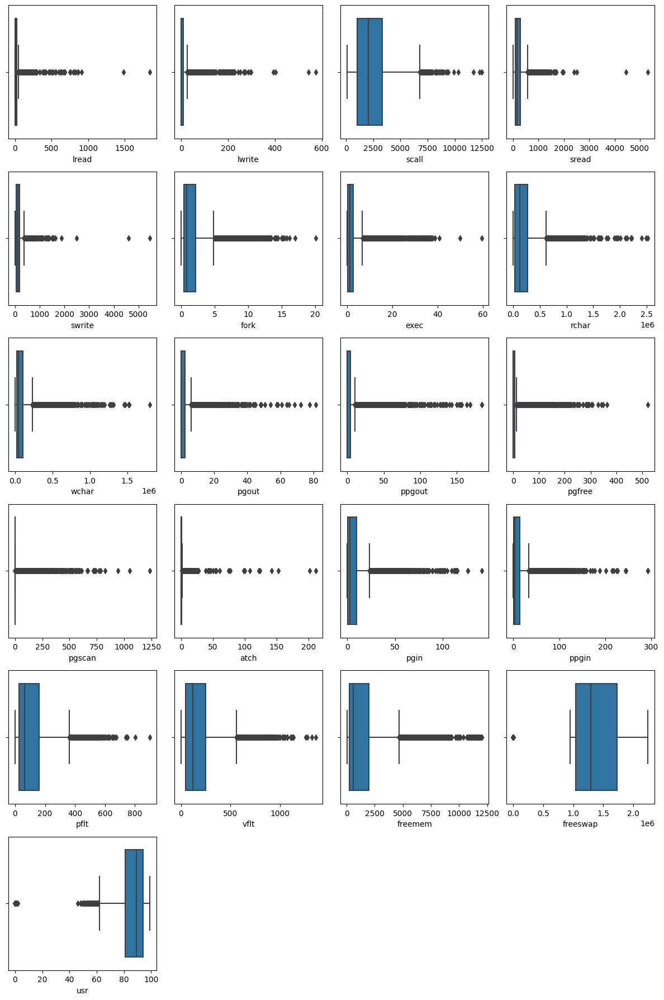

In [13]:
plot_univariate_numeric(df, num_cols, subplot_cols=4)

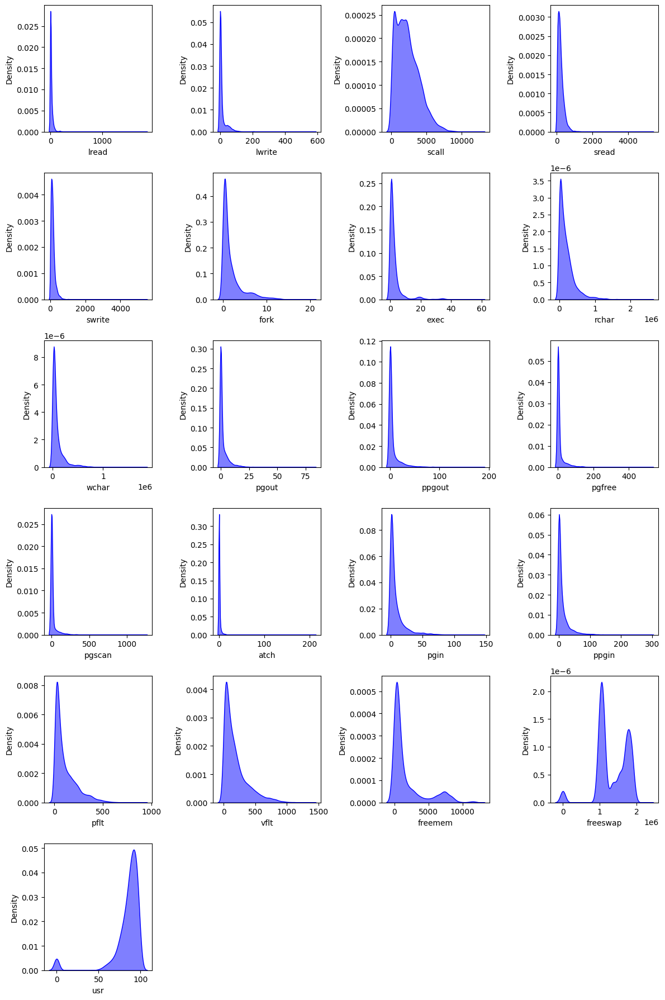

In [14]:
plot_univariate_numeric(df, num_cols, subplot_cols=4, kind='density')

* It is clearly evident from above boxplots and Density plots that every feature has outliers.
* Due to outliers, we can see long tails on either sides on the density plots.
* Outliers are a great effect on Linear models and hence, we should be treating outliers with IQR method before doing modelling.

<IPython.core.display.Javascript object>

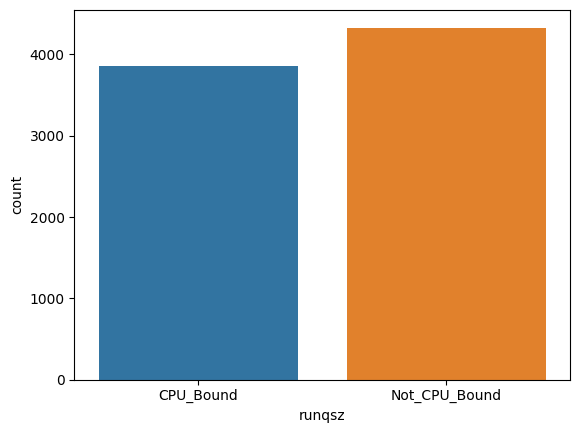

In [15]:
sns.countplot(x=df.runqsz);

In [16]:
df.runqsz.value_counts(1)

runqsz
Not_CPU_Bound    0.528687
CPU_Bound        0.471313
Name: proportion, dtype: float64

* Feature runqsz has almost equal ratio in the data. Around 50% each for CPU_Bound and Not_CPU_Bound.
* But we should be seeing its effect on target variable and decide it's importance in the modelling.

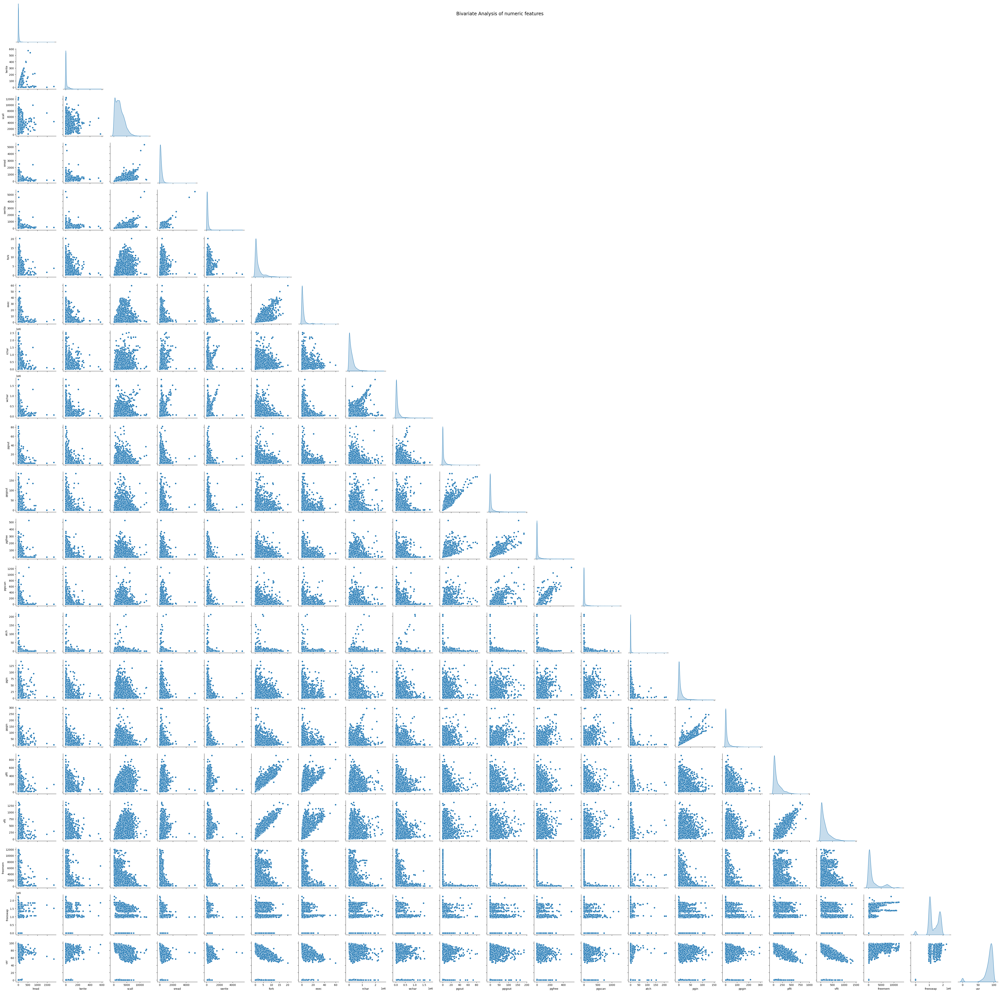

In [17]:
plot_bivariate_numeric(df, num_cols)

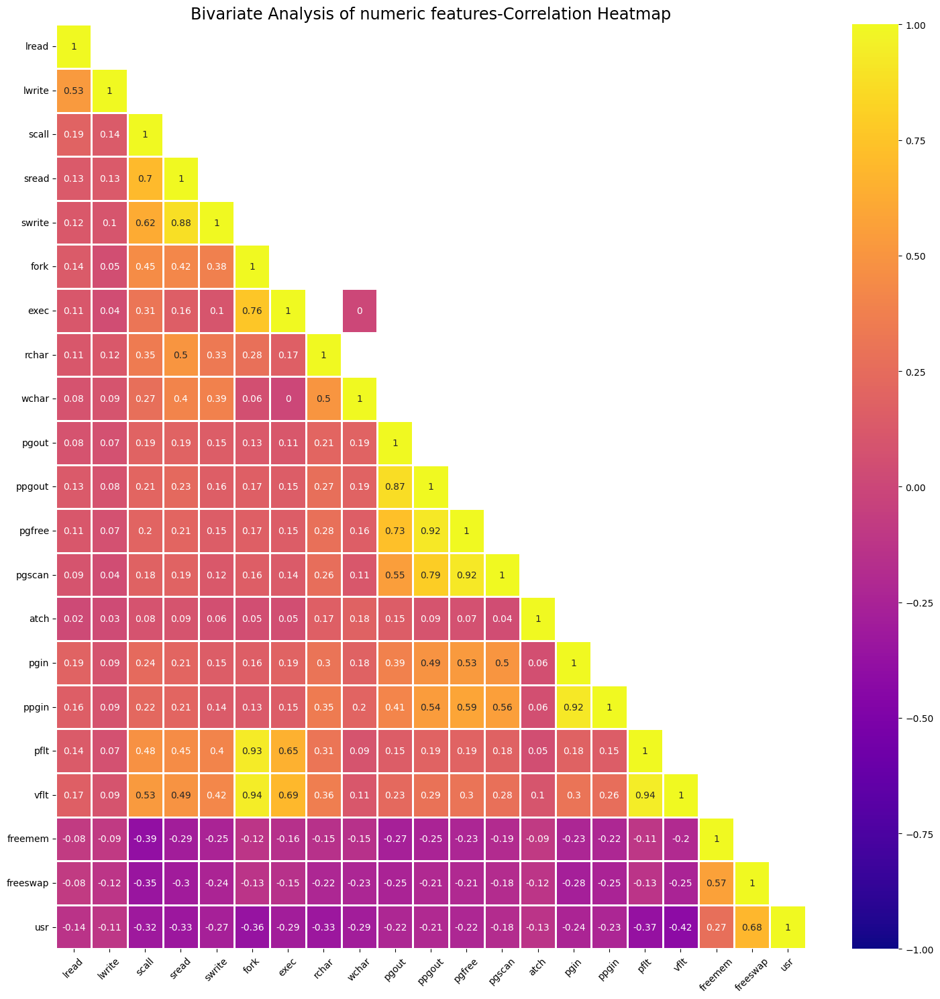

In [18]:
plot_bivariate_numeric(df, num_cols, kind='heatmap', figsize=(15,15))

* From scatterplots and heatmap, we can see multicollinearity between independent variables.
* Few independent showing high multicollinearity which might effect Linear Model/ Regression assumptions are,
    - fork vs pflt
    - fork vs vflt
    - pflt vs vflt
    - pgin vs ppgin
    - pgfree vs pfscan
    - pgfree vs ppout
* The above mentioned list doesn't stop and we can see more than 90% correlation between above independent features.
* Our case of interest is Dependent variable (usr) vs independent variables correlation - 
    - freeswap vs usr (0.68)
* A good observation is that except 2 independent features (freemem, freeswap), remaining all independent features are showing negative correlation with dependent variable.
* All those independent varables having weak correlation with target variable, i.e., around -0.4 to -0.2

<IPython.core.display.Javascript object>

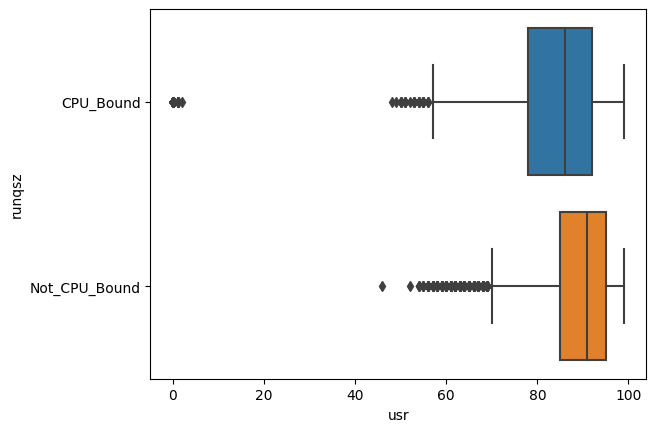

In [19]:
sns.boxplot(x=df.usr, y=df.runqsz);

* For runqsz feature, there is slight variation with target variable. 
* The Mean value is varying in both the boxplots which will be good sign/predictor for target variable.

In [20]:
df_copy1 = df.copy()
df_copy1.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


### Preprocessing

In [21]:
df_copy1.isna().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [22]:
df_copy1[['rchar','wchar']].describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
rchar,8088.0,197385.73,239837.49,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,95902.99,140841.71,1498.0,22916.0,46619.0,106101.00,1801623.0


In [23]:
# Impute null values using Median

df_copy1.rchar.fillna(df_copy1.rchar.median(), inplace=True)
df_copy1.wchar.fillna(df_copy1.wchar.median(), inplace=True)

* Imputed missing values in the features *rchar, wchar* using Median.
* Reason for using Median rather than Mean because of the presence of huge outliers in the dataset.

In [24]:
df_copy1.isna().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [25]:
def outliers_treatment(col):
    q1,q3 = df_copy1[col].quantile([0.25,0.75])
    iqr = q3-q1
    lower_bound = q1-1.5*iqr
    upper_bound = q3+1.5*iqr
    return (lower_bound, upper_bound)

In [26]:
# Treat outliers using IQR Method

for col in num_cols:
    lower_bound, upper_bound = outliers_treatment(col)
    df_copy1[col] = np.where(df_copy1[col]<lower_bound, lower_bound, df_copy1[col])
    df_copy1[col] = np.where(df_copy1[col]>upper_bound, upper_bound, df_copy1[col])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

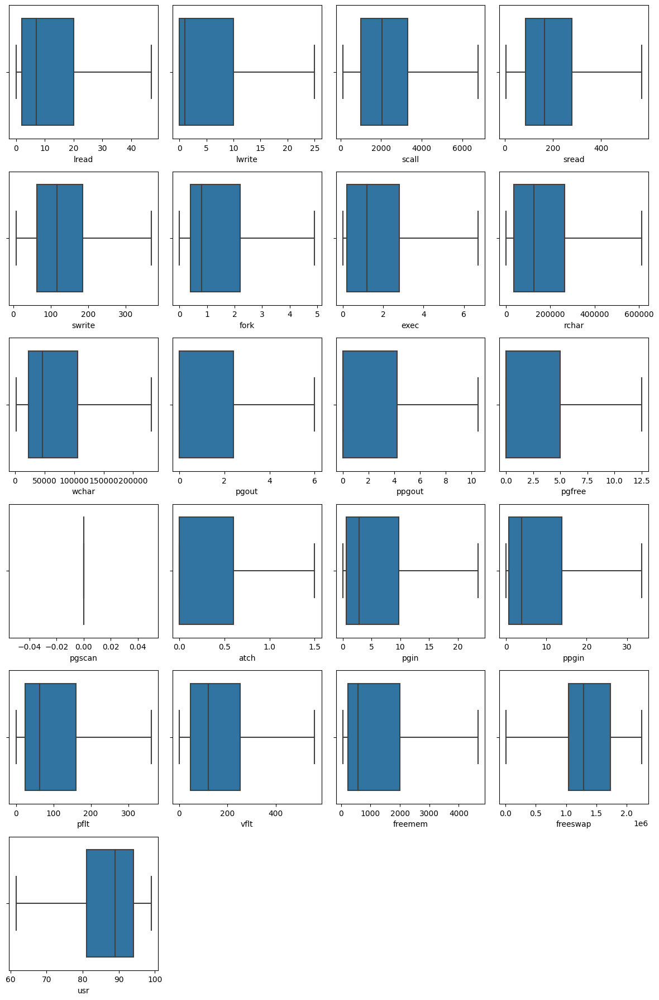

In [27]:
plot_univariate_numeric(df_copy1, num_cols, subplot_cols=4)

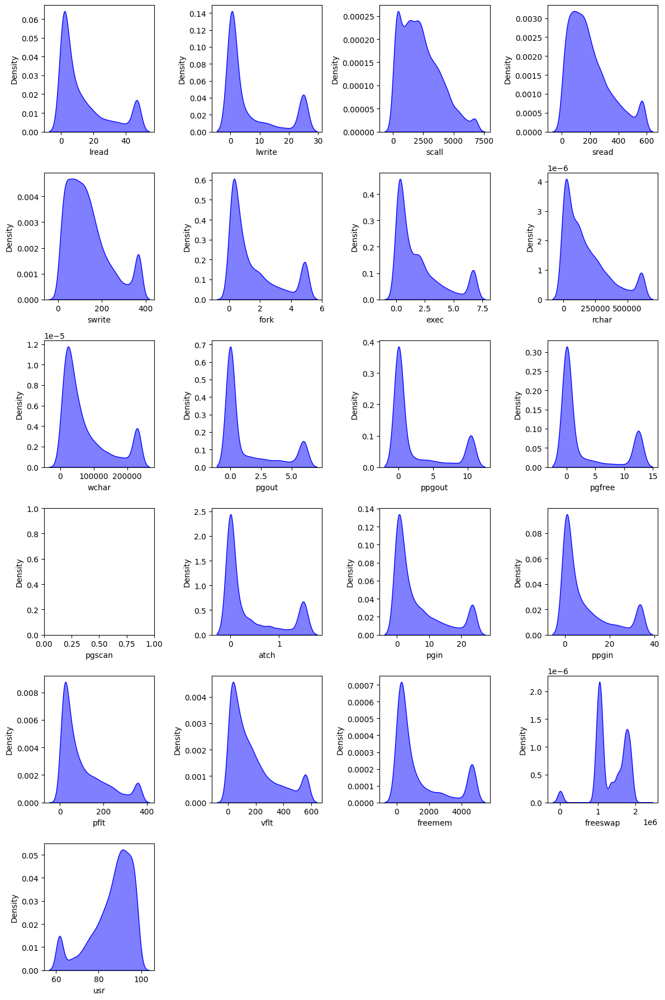

In [28]:
plot_univariate_numeric(df_copy1, num_cols, subplot_cols=4, kind='density')

* From above plots, we can clearly say that we don't have any outliers in our data. 
* But the outliers being huge in number, while imputing these data points created one more peak in the density plots.
* Earlier, we are not able to see the density plots due to presence of long tails but it is clearly visible and we have made enough changes for Regression Assumptions.
* A strange behaviour can be seen in feature *pgscan* where all the data points are 0 now. This happened due to the reason that 75% of the values in this feature are 0 and remaining 25% being outliers are masked as 0 causing whole column being constant. 
* This feature *pgscan* or any feature having constant value in a column is not gonna help in our predictions or modelling. We need to drop this feature.

In [29]:
df_copy1.pgscan.describe()

count    8192.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: pgscan, dtype: float64

In [30]:
df_copy1.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,13.42,15.16,0.0,2.00,7.0,20.00,47.00
lwrite,8192.0,6.66,9.29,0.0,0.00,1.0,10.00,25.00
scall,8192.0,2294.48,1593.09,109.0,1012.00,2051.5,3317.25,6775.12
sread,8192.0,199.78,146.76,6.0,86.00,166.0,279.00,568.50
swrite,8192.0,137.97,97.14,7.0,63.00,117.0,185.00,368.00
fork,8192.0,1.56,1.59,0.0,0.40,0.8,2.20,4.90
exec,8192.0,1.93,2.03,0.0,0.20,1.2,2.80,6.70
rchar,8192.0,178884.07,174589.21,278.0,34860.50,125473.5,265394.75,611196.12
wchar,8192.0,75645.54,71262.96,1498.0,22977.75,46619.0,106037.00,230625.88
pgout,8192.0,1.42,2.20,0.0,0.00,0.0,2.40,6.00


In [31]:
# Dropping pgscan feature becacuse it has constant value

df_copy1 = df_copy1.drop('pgscan',axis=1)

### Reasons for 0 values in data - Drop?

### Feature Engineering

### Scaling and Splitting of the Data

In [32]:
df_copy1.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633.000,1760253.0,90.0


In [33]:
x = df_copy1.drop('usr',axis=1)
y = df_copy1.usr

In [34]:
num_cols1 = x.columns.to_list()
num_cols1.remove('runqsz')
x_num = x[num_cols1]
x_cat = x[cat_cols]

In [35]:
x_num.columns, x_cat.columns

(Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
        'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
        'vflt', 'freemem', 'freeswap'],
       dtype='object'),
 Index(['runqsz'], dtype='object'))

In [36]:
# Scaling the numerical data

from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
x_num_scaled = ss.fit_transform(x_num)
x_num_scaled = pd.DataFrame(x_num_scaled, columns=x_num.columns)
x_num_scaled.head()

<IPython.core.display.Javascript object>

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap
0,-0.819513,-0.716521,-0.092583,-0.823008,-0.720331,-0.853341,-0.853740,-0.791696,-0.303831,-0.64583,-0.634297,-0.635071,-0.689780,-0.622761,-0.586048,-0.882744,-0.918365,2.037473,0.956433
1,-0.885482,-0.716521,-1.333640,-1.238681,-1.204189,-0.853341,-0.853740,-1.022096,-0.943894,-0.64583,-0.634297,-0.635071,-0.689780,-0.830987,-0.819018,-0.886387,-0.977262,2.037473,1.284547
2,0.104042,-0.393641,-0.083166,-0.277863,-0.195293,0.277935,0.231003,-0.305940,-0.613197,-0.64583,-0.634297,-0.635071,1.442029,-0.050138,0.023258,0.438869,0.274345,-0.427003,-0.730310
3,-0.885482,-0.716521,-1.339918,-1.279567,-1.255663,-0.853341,-0.853740,-0.305940,-0.939894,-0.64583,-0.634297,-0.635071,-0.689780,-0.804959,-0.801097,-0.886683,-0.977446,2.037473,1.271955
4,-0.555640,-0.608895,-1.233200,-1.095580,-1.029176,-0.727644,-0.755127,-0.305940,-0.890567,-0.64583,-0.634297,-0.635071,-0.689780,-0.700845,-0.711493,-0.668055,-0.787893,-0.469976,1.026087


In [37]:
x_num_scaled.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,0.0,1.0,-0.89,-0.75,-0.42,0.43,2.22
lwrite,8192.0,0.0,1.0,-0.72,-0.72,-0.61,0.36,1.97
scall,8192.0,-0.0,1.0,-1.37,-0.81,-0.15,0.64,2.81
sread,8192.0,0.0,1.0,-1.32,-0.78,-0.23,0.54,2.51
swrite,8192.0,-0.0,1.0,-1.35,-0.77,-0.22,0.48,2.37
fork,8192.0,0.0,1.0,-0.98,-0.73,-0.48,0.40,2.10
exec,8192.0,0.0,1.0,-0.95,-0.85,-0.36,0.43,2.35
rchar,8192.0,0.0,1.0,-1.02,-0.82,-0.31,0.50,2.48
wchar,8192.0,0.0,1.0,-1.04,-0.74,-0.41,0.43,2.17
pgout,8192.0,-0.0,1.0,-0.65,-0.65,-0.65,0.45,2.08


In [38]:
x_cat.replace({'CPU_Bound':1, 'Not_CPU_Bound':0}, inplace=True)

x_cat.head()

,runqsz
0,1
1,0
2,0
3,0
4,0


In [39]:
x_scaled = pd.concat([x_num_scaled, x_cat], axis=1)
x_scaled.head()

<IPython.core.display.Javascript object>

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz
0,-0.819513,-0.716521,-0.092583,-0.823008,-0.720331,-0.853341,-0.853740,-0.791696,-0.303831,-0.64583,-0.634297,-0.635071,-0.689780,-0.622761,-0.586048,-0.882744,-0.918365,2.037473,0.956433,1
1,-0.885482,-0.716521,-1.333640,-1.238681,-1.204189,-0.853341,-0.853740,-1.022096,-0.943894,-0.64583,-0.634297,-0.635071,-0.689780,-0.830987,-0.819018,-0.886387,-0.977262,2.037473,1.284547,0
2,0.104042,-0.393641,-0.083166,-0.277863,-0.195293,0.277935,0.231003,-0.305940,-0.613197,-0.64583,-0.634297,-0.635071,1.442029,-0.050138,0.023258,0.438869,0.274345,-0.427003,-0.730310,0
3,-0.885482,-0.716521,-1.339918,-1.279567,-1.255663,-0.853341,-0.853740,-0.305940,-0.939894,-0.64583,-0.634297,-0.635071,-0.689780,-0.804959,-0.801097,-0.886683,-0.977446,2.037473,1.271955,0
4,-0.555640,-0.608895,-1.233200,-1.095580,-1.029176,-0.727644,-0.755127,-0.305940,-0.890567,-0.64583,-0.634297,-0.635071,-0.689780,-0.700845,-0.711493,-0.668055,-0.787893,-0.469976,1.026087,0


In [40]:
df_scaled = pd.concat([x_scaled, y], axis=1)
df_scaled.head()

<IPython.core.display.Javascript object>

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz,usr
0,-0.819513,-0.716521,-0.092583,-0.823008,-0.720331,-0.853341,-0.853740,-0.791696,-0.303831,-0.64583,...,-0.635071,-0.689780,-0.622761,-0.586048,-0.882744,-0.918365,2.037473,0.956433,1,95.0
1,-0.885482,-0.716521,-1.333640,-1.238681,-1.204189,-0.853341,-0.853740,-1.022096,-0.943894,-0.64583,...,-0.635071,-0.689780,-0.830987,-0.819018,-0.886387,-0.977262,2.037473,1.284547,0,97.0
2,0.104042,-0.393641,-0.083166,-0.277863,-0.195293,0.277935,0.231003,-0.305940,-0.613197,-0.64583,...,-0.635071,1.442029,-0.050138,0.023258,0.438869,0.274345,-0.427003,-0.730310,0,87.0
3,-0.885482,-0.716521,-1.339918,-1.279567,-1.255663,-0.853341,-0.853740,-0.305940,-0.939894,-0.64583,...,-0.635071,-0.689780,-0.804959,-0.801097,-0.886683,-0.977446,2.037473,1.271955,0,98.0
4,-0.555640,-0.608895,-1.233200,-1.095580,-1.029176,-0.727644,-0.755127,-0.305940,-0.890567,-0.64583,...,-0.635071,-0.689780,-0.700845,-0.711493,-0.668055,-0.787893,-0.469976,1.026087,0,90.0


In [41]:
# splitting of the data using Train Test Split

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, random_state=27, test_size=0.3)

# Modelling

### OLS Method 

In [42]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [43]:
x_train_const = sm.add_constant(x_train)  # This adds the constant term beta0 to the Simple Linear Regression.
x_test_const = sm.add_constant(x_test)

In [44]:
model_1 = sm.OLS(y_train,x_train_const)
res_1 = model_1.fit()
res_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1079.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:35:58   Log-Likelihood:                -16709.
No. Observations:                5734   AIC:                         3.346e+04
Df Residuals:                    5713   BIC:                         3.360e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0725      0.084   1035.965      0.000      86.908      87.237
lread         -1.0333      0.134     -7.740      0.000      -1.295      -0.772
lwrite         0.5163      0.121      4.265      0.000       0.279       0.754
scall         -1.0561      0.103    -10.280      0.000      -1.258      -0.855
sread          0.3168      0.149      2.124      0.034       0.024       0.609
swrite        -0.6708      0.140     -4.804      0.000      -0.945      -0.397
fork           0.2307      0.214      1.080      0.280      -0.188       0.649
exec          -0.6511      0.105     -6.223      0.000      -0.856      -0.446
rchar         -0.8667      0.084    -10.305      0.000      -1.032      -0.702
wchar         -0.4053      0.076     -5.363      0.000      -0.553      -0.257
pgout         -0.9558      0.199     -4.810      0.000      -1.345      -0.566
ppgout        -0.1864      0.333     -0.560      0.576      -0.840       0.467
pgfree         0.4309      0.251      1.719      0.086      -0.060       0.922
atch           0.3926      0.081      4.829      0.000       0.233       0.552
pgin           0.1253      0.218      0.576      0.564      -0.301       0.552
ppgin         -0.7330      0.220     -3.338      0.001      -1.163      -0.303
pflt          -3.6333      0.206    -17.620      0.000      -4.038      -3.229
vflt          -0.8434      0.232     -3.643      0.000      -1.297      -0.390
freemem       -0.7434      0.083     -8.941      0.000      -0.906      -0.580
freeswap       3.8048      0.081     47.070      0.000       3.646       3.963
runqsz        -1.6726      0.127    -13.200      0.000      -1.921      -1.424
==============================================================================
Omnibus:                     1083.409   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2330.696
Skew:                          -1.099   Prob(JB):                         0.00
Kurtosis:                       5.219   Cond. No.                         19.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [45]:
from sklearn.metrics import *

In [46]:
y_pred_1 = res_1.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, res_1.fittedvalues)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, y_pred_1)))
print('MAE on Train Data - ', mean_absolute_error(y_train, res_1.fittedvalues))
print('MAE on Test Data - ', mean_absolute_error(y_test, y_pred_1))
print('r2_score on Train Data - ',r2_score(y_train, res_1.fittedvalues))
print('r2_score on Test Data - ',r2_score(y_test, y_pred_1))
print('Adj r2_score on Train Data - ',res_1.rsquared_adj)

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.459529819741849


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.5573623477412895
MAE on Train Data -  3.3059512669513227
MAE on Test Data -  3.3517567565399347
r2_score on Train Data -  0.790625379955566
r2_score on Test Data -  0.7816325347351172
Adj r2_score on Train Data -  0.7898924038657903


In [47]:
vif_series1 = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

<IPython.core.display.Javascript object>

VIF values: 

const        2.029354
lread        5.180361
lwrite       4.251030
scall        3.036071
sread        6.416125
swrite       5.622703
fork        13.131828
exec         3.152331
rchar        2.044042
wchar        1.622531
pgout       11.367743
ppgout      32.087214
pgfree      18.094473
atch         1.877721
pgin        13.570341
ppgin       13.821852
pflt        12.286515
vflt        15.463754
freemem      1.970506
freeswap     1.857767
runqsz       1.149422
dtype: float64



* Taking threshold as 0 for Variance Inflation factor, WE can find few variables showing vif score >10 and these variables must be dropped accordingly.

In [48]:
# Try dropping ppgout and check scores for evaluation

model_2 = sm.OLS(y_train,x_train_const.drop('ppgout', axis=1))
res_2 = model_2.fit()
print(
    "Dropping ppgout\n"
    "R-squared:",
    np.round(res_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_2.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping ppgout
R-squared: 0.791 
Adjusted R-squared: 0.79


* No change in scores dropping *ppgout* variable. This will be dropped and lets check other variables also.

In [49]:
# Try dropping pgfree and check scores for evaluation

model_3 = sm.OLS(y_train,x_train_const.drop('pgfree', axis=1))
res_3 = model_3.fit()
print(
    "Dropping pgfree\n"
    "R-squared:",
    np.round(res_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_3.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping pgfree
R-squared: 0.791 
Adjusted R-squared: 0.79


* No change in scores dropping *pgfree* variable. This will be dropped and lets check other variables also.

In [50]:
# Try dropping vflt and check scores for evaluation

model_4 = sm.OLS(y_train,x_train_const.drop('vflt', axis=1))
res_4 = model_4.fit()
print(
    "Dropping vflt\n"
    "R-squared:",
    np.round(res_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_4.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping vflt
R-squared: 0.79 
Adjusted R-squared: 0.789


* Slight 0.01 decrease in scores  but still it is fesible. 
* Now we can drop variables *ppgout, pgfree* from data and create new model to check VIF scores again.

In [51]:
# Since there is no change in score after dropping ppgout and pgfree, we can drop these features and check new VIF scores.

x_train_const.drop(['ppgout','pgfree'], axis=1, inplace=True)
model_5 = sm.OLS(y_train,x_train_const)
res_5 = model_5.fit()
res_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1198.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:36:00   Log-Likelihood:                -16711.
No. Observations:                5734   AIC:                         3.346e+04
Df Residuals:                    5715   BIC:                         3.359e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0720      0.084   1035.732      0.000      86.907      87.237
lread         -1.0283      0.133     -7.710      0.000      -1.290      -0.767
lwrite         0.5087      0.121      4.207      0.000       0.272       0.746
scall         -1.0616      0.103    -10.333      0.000      -1.263      -0.860
sread          0.3249      0.149      2.179      0.029       0.033       0.617
swrite        -0.6740      0.140     -4.826      0.000      -0.948      -0.400
fork           0.2260      0.214      1.058      0.290      -0.193       0.645
exec          -0.6499      0.105     -6.210      0.000      -0.855      -0.445
rchar         -0.8670      0.084    -10.306      0.000      -1.032      -0.702
wchar         -0.4089      0.075     -5.418      0.000      -0.557      -0.261
pgout         -0.7638      0.085     -9.012      0.000      -0.930      -0.598
atch           0.3968      0.081      4.882      0.000       0.237       0.556
pgin           0.0986      0.217      0.454      0.650      -0.327       0.524
ppgin         -0.6865      0.218     -3.147      0.002      -1.114      -0.259
pflt          -3.6495      0.206    -17.708      0.000      -4.054      -3.245
vflt          -0.8129      0.231     -3.517      0.000      -1.266      -0.360
freemem       -0.7602      0.083     -9.178      0.000      -0.923      -0.598
freeswap       3.8116      0.081     47.206      0.000       3.653       3.970
runqsz        -1.6720      0.127    -13.192      0.000      -1.920      -1.424
==============================================================================
Omnibus:                     1085.966   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2340.729
Skew:                          -1.101   Prob(JB):                         0.00
Kurtosis:                       5.225   Cond. No.                         13.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [52]:
x_test_const.drop(['ppgout','pgfree'], axis=1, inplace=True)

y_pred_5 = res_5.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, res_5.fittedvalues)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, y_pred_5)))
print('MAE on Train Data - ', mean_absolute_error(y_train, res_5.fittedvalues))
print('MAE on Test Data - ', mean_absolute_error(y_test, y_pred_5))
print('r2_score on Train Data - ',r2_score(y_train, res_5.fittedvalues))
print('r2_score on Test Data - ',r2_score(y_test, y_pred_5))
print('Adj r2_score on Train Data - ',res_5.rsquared_adj)

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.461507158624472


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.559989460176887
MAE on Train Data -  3.306783129711216
MAE on Test Data -  3.353909148360696
r2_score on Train Data -  0.79043966694185
r2_score on Test Data -  0.7813807043170863
Adj r2_score on Train Data -  0.789779634396785


In [53]:
vif_series2 = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

<IPython.core.display.Javascript object>

VIF values: 

const        2.029152
lread        5.167938
lwrite       4.240053
scall        3.034295
sread        6.411098
swrite       5.622060
fork        13.129449
exec         3.151646
rchar        2.043867
wchar        1.617547
pgout        2.067126
atch         1.875574
pgin        13.501048
ppgin       13.639222
pflt        12.267222
vflt        15.402570
freemem      1.954500
freeswap     1.852669
runqsz       1.149416
dtype: float64



In [54]:
# Try dropping vflt and check scores for evaluation

model_6 = sm.OLS(y_train,x_train_const.drop('vflt', axis=1))
res_6 = model_6.fit()
print(
    "Dropping vflt\n"
    "R-squared:",
    np.round(res_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_6.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping vflt
R-squared: 0.79 
Adjusted R-squared: 0.789


* Slight drop of 0.001 in Adj-Rsquared without vflt.

In [55]:
# Try dropping ppgin and check scores for evaluation

model_7 = sm.OLS(y_train,x_train_const.drop('ppgin', axis=1))
res_7 = model_7.fit()
print(
    "Dropping ppgin\n"
    "R-squared:",
    np.round(res_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_7.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping ppgin
R-squared: 0.79 
Adjusted R-squared: 0.789


* Slight drop of 0.001 in Adj-Rsquared without ppgin.

In [56]:
# Try dropping pgin and check scores for evaluation

model_8 = sm.OLS(y_train,x_train_const.drop('pgin', axis=1))
res_8 = model_8.fit()
print(
    "Dropping pgin\n"
    "R-squared:",
    np.round(res_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_8.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping pgin
R-squared: 0.79 
Adjusted R-squared: 0.79


* No drop in R-square and Adj-Rsquared, pgin can be dropped.

In [57]:
# Try dropping fork and check scores for evaluation

model_9 = sm.OLS(y_train,x_train_const.drop('fork', axis=1))
res_9 = model_9.fit()
print(
    "Dropping fork\n"
    "R-squared:",
    np.round(res_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_9.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping fork
R-squared: 0.79 
Adjusted R-squared: 0.79


* No drop in R-square and Adj-Rsquared, fork can be dropped.

In [58]:
# Try dropping pflt and check scores for evaluation

model_10 = sm.OLS(y_train,x_train_const.drop('pflt', axis=1))
res_10 = model_10.fit()
print(
    "Dropping pflt\n"
    "R-squared:",
    np.round(res_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_10.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping pflt
R-squared: 0.779 
Adjusted R-squared: 0.778


* A lil change in R-squared and Adj-Rsquared when dropping pflt i.e., ~ 0.02. So let's keep this variable as such for now.

* Drop variables which has no impact on model, such as - *pgin, fork* and check new VIFs scores again.

In [59]:
# Since there is no change in score after dropping pgin and fork, we can drop these features and check new VIF scores.

x_train_const.drop(['pgin','fork'], axis=1, inplace=True)
model_11 = sm.OLS(y_train,x_train_const)
res_11 = model_11.fit()
res_11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1347.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:36:02   Log-Likelihood:                -16712.
No. Observations:                5734   AIC:                         3.346e+04
Df Residuals:                    5717   BIC:                         3.357e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0716      0.084   1035.811      0.000      86.907      87.236
lread         -1.0280      0.133     -7.714      0.000      -1.289      -0.767
lwrite         0.5049      0.121      4.179      0.000       0.268       0.742
scall         -1.0751      0.102    -10.574      0.000      -1.274      -0.876
sread          0.3171      0.149      2.129      0.033       0.025       0.609
swrite        -0.6463      0.137     -4.714      0.000      -0.915      -0.378
exec          -0.6191      0.101     -6.140      0.000      -0.817      -0.421
rchar         -0.8698      0.084    -10.359      0.000      -1.034      -0.705
wchar         -0.4105      0.075     -5.440      0.000      -0.558      -0.263
pgout         -0.7666      0.085     -9.048      0.000      -0.933      -0.600
atch           0.3928      0.081      4.839      0.000       0.234       0.552
ppgin         -0.6084      0.076     -8.026      0.000      -0.757      -0.460
pflt          -3.5681      0.188    -18.953      0.000      -3.937      -3.199
vflt          -0.6907      0.204     -3.390      0.001      -1.090      -0.291
freemem       -0.7587      0.083     -9.162      0.000      -0.921      -0.596
freeswap       3.8172      0.080     47.672      0.000       3.660       3.974
runqsz        -1.6719      0.127    -13.193      0.000      -1.920      -1.424
==============================================================================
Omnibus:                     1086.664   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2334.458
Skew:                          -1.103   Prob(JB):                         0.00
Kurtosis:                       5.215   Cond. No.                         10.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [60]:
x_test_const.drop(['pgin','fork'], axis=1, inplace=True)

y_pred_11 = res_11.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, res_11.fittedvalues)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, y_pred_11)))
print('MAE on Train Data - ', mean_absolute_error(y_train, res_11.fittedvalues))
print('MAE on Test Data - ', mean_absolute_error(y_test, y_pred_11))
print('r2_score on Train Data - ',r2_score(y_train, res_11.fittedvalues))
print('r2_score on Test Data - ',r2_score(y_test, y_pred_11))
print('Adj r2_score on Train Data - ',res_11.rsquared_adj)

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.462020961914517


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.556815988225482
MAE on Train Data -  3.307631665315581
MAE on Test Data -  3.3530018664643237
r2_score on Train Data -  0.7903913967117445
r2_score on Test Data -  0.7816848895763244
Adj r2_score on Train Data -  0.7898047712696225


In [61]:
vif_series3 = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

<IPython.core.display.Javascript object>

VIF values: 

const        2.029072
lread        5.159974
lwrite       4.233552
scall        2.971821
sread        6.396648
swrite       5.418612
exec         2.926081
rchar        2.036400
wchar        1.616840
pgout        2.065471
atch         1.871527
ppgin        1.646763
pflt        10.236982
vflt        11.971061
freemem      1.953954
freeswap     1.822276
runqsz       1.149313
dtype: float64



In [62]:
# Try dropping vflt and check scores for evaluation

model_12 = sm.OLS(y_train,x_train_const.drop('vflt', axis=1))
res_12 = model_12.fit()
print(
    "Dropping vflt\n"
    "R-squared:",
    np.round(res_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_12.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping vflt
R-squared: 0.79 
Adjusted R-squared: 0.789


In [63]:
# Try dropping pflt and check scores for evaluation

model_13 = sm.OLS(y_train,x_train_const.drop('pflt', axis=1))
res_13 = model_13.fit()
print(
    "Dropping pflt\n"
    "R-squared:",
    np.round(res_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(res_13.rsquared_adj, 3),
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dropping pflt
R-squared: 0.777 
Adjusted R-squared: 0.777


* From the above 2 cells, 
    - Dropping vflt has no major impact but just 0.001 change in Adj-Rsquared.
    - Dropping pflt has slight change in scores around 2%. 
* Lets drop vflt for now and check scores.

In [64]:
# Since there is small change in score after dropping vflt, we can drop this feature and check new VIF scores.

x_train_const.drop(['vflt'], axis=1, inplace=True)
model_14 = sm.OLS(y_train,x_train_const)
res_14 = model_14.fit()
res_14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1434.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:36:04   Log-Likelihood:                -16718.
No. Observations:                5734   AIC:                         3.347e+04
Df Residuals:                    5718   BIC:                         3.357e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0690      0.084   1034.873      0.000      86.904      87.234
lread         -1.0587      0.133     -7.955      0.000      -1.320      -0.798
lwrite         0.5210      0.121      4.311      0.000       0.284       0.758
scall         -1.0703      0.102    -10.519      0.000      -1.270      -0.871
sread          0.2849      0.149      1.915      0.056      -0.007       0.576
swrite        -0.6895      0.137     -5.046      0.000      -0.957      -0.422
exec          -0.6854      0.099     -6.922      0.000      -0.879      -0.491
rchar         -0.8876      0.084    -10.581      0.000      -1.052      -0.723
wchar         -0.3740      0.075     -5.003      0.000      -0.521      -0.227
pgout         -0.7807      0.085     -9.218      0.000      -0.947      -0.615
atch           0.3777      0.081      4.655      0.000       0.219       0.537
ppgin         -0.6797      0.073     -9.323      0.000      -0.823      -0.537
pflt          -4.0863      0.110    -37.140      0.000      -4.302      -3.871
freemem       -0.7684      0.083     -9.277      0.000      -0.931      -0.606
freeswap       3.8592      0.079     48.737      0.000       3.704       4.014
runqsz        -1.6697      0.127    -13.164      0.000      -1.918      -1.421
==============================================================================
Omnibus:                     1044.904   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2218.375
Skew:                          -1.069   Prob(JB):                         0.00
Kurtosis:                       5.172   Cond. No.                         7.43
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [65]:
x_test_const.drop(['vflt'], axis=1, inplace=True)

y_pred_14 = res_14.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, res_14.fittedvalues)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, y_pred_14)))
print('MAE on Train Data - ', mean_absolute_error(y_train, res_14.fittedvalues))
print('MAE on Test Data - ', mean_absolute_error(y_test, y_pred_14))
print('r2_score on Train Data - ',r2_score(y_train, res_14.fittedvalues))
print('r2_score on Test Data - ',r2_score(y_test, y_pred_14))
print('Adj r2_score on Train Data - ',res_14.rsquared_adj)

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.466504135062587


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.573436128757124
MAE on Train Data -  3.308813411300751
MAE on Test Data -  3.369203414455375
r2_score on Train Data -  0.7899699806076645
r2_score on Test Data -  0.7800894576636427
Adj r2_score on Train Data -  0.7894190099376952


In [66]:
vif_series4 = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

<IPython.core.display.Javascript object>

VIF values: 

const       2.028906
lread       5.136275
lwrite      4.227055
scall       2.971260
sread       6.370561
swrite      5.371825
exec        2.816299
rchar       2.028516
wchar       1.583951
pgout       2.060487
atch        1.865843
ppgin       1.520235
pflt        3.490006
freemem     1.951610
freeswap    1.778750
runqsz      1.149282
dtype: float64



* That's pretty good features, we have dropped 5 features in 20 total but still having same score for R-Squared and small minute change ~0.1% in Adj-Rsquared data.
* Updated 15 features don't show any VIF>10 and it is accepted for our consideration for modelling. We are good with these features and model 14

In [67]:
res_14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1434.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:36:05   Log-Likelihood:                -16718.
No. Observations:                5734   AIC:                         3.347e+04
Df Residuals:                    5718   BIC:                         3.357e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0690      0.084   1034.873      0.000      86.904      87.234
lread         -1.0587      0.133     -7.955      0.000      -1.320      -0.798
lwrite         0.5210      0.121      4.311      0.000       0.284       0.758
scall         -1.0703      0.102    -10.519      0.000      -1.270      -0.871
sread          0.2849      0.149      1.915      0.056      -0.007       0.576
swrite        -0.6895      0.137     -5.046      0.000      -0.957      -0.422
exec          -0.6854      0.099     -6.922      0.000      -0.879      -0.491
rchar         -0.8876      0.084    -10.581      0.000      -1.052      -0.723
wchar         -0.3740      0.075     -5.003      0.000      -0.521      -0.227
pgout         -0.7807      0.085     -9.218      0.000      -0.947      -0.615
atch           0.3777      0.081      4.655      0.000       0.219       0.537
ppgin         -0.6797      0.073     -9.323      0.000      -0.823      -0.537
pflt          -4.0863      0.110    -37.140      0.000      -4.302      -3.871
freemem       -0.7684      0.083     -9.277      0.000      -0.931      -0.606
freeswap       3.8592      0.079     48.737      0.000       3.704       4.014
runqsz        -1.6697      0.127    -13.164      0.000      -1.918      -1.421
==============================================================================
Omnibus:                     1044.904   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2218.375
Skew:                          -1.069   Prob(JB):                         0.00
Kurtosis:                       5.172   Cond. No.                         7.43
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* From Statistical view, if the p-value for a feature is >0.05 then it is considered as in-significant and we should be dropping those features from model.
* From above summary output, we can see feature *sread* has p-value 0.056(>0.05). Though it very close, let us check scores without this variable.

In [68]:
# Since sread feature is in-significant in predicting target variable, we should be good to drop this feature.

x_train_const.drop(['sread'], axis=1, inplace=True)
model_15 = sm.OLS(y_train,x_train_const)
res_15 = model_15.fit()
res_15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1535.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:36:06   Log-Likelihood:                -16720.
No. Observations:                5734   AIC:                         3.347e+04
Df Residuals:                    5719   BIC:                         3.357e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0701      0.084   1034.666      0.000      86.905      87.235
lread         -1.0691      0.133     -8.037      0.000      -1.330      -0.808
lwrite         0.5327      0.121      4.413      0.000       0.296       0.769
scall         -1.0092      0.097    -10.443      0.000      -1.199      -0.820
swrite        -0.5159      0.102     -5.045      0.000      -0.716      -0.315
exec          -0.6940      0.099     -7.014      0.000      -0.888      -0.500
rchar         -0.8199      0.076    -10.775      0.000      -0.969      -0.671
wchar         -0.3864      0.074     -5.188      0.000      -0.532      -0.240
pgout         -0.7759      0.085     -9.163      0.000      -0.942      -0.610
atch           0.3730      0.081      4.599      0.000       0.214       0.532
ppgin         -0.6830      0.073     -9.369      0.000      -0.826      -0.540
pflt          -4.0680      0.110    -37.105      0.000      -4.283      -3.853
freemem       -0.7660      0.083     -9.247      0.000      -0.928      -0.604
freeswap       3.8449      0.079     48.763      0.000       3.690       3.999
runqsz        -1.6711      0.127    -13.172      0.000      -1.920      -1.422
==============================================================================
Omnibus:                     1051.276   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2241.320
Skew:                          -1.073   Prob(JB):                         0.00
Kurtosis:                       5.186   Cond. No.                         6.54
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [69]:
x_test_const.drop(['sread'], axis=1, inplace=True)

y_pred_15 = res_15.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, res_15.fittedvalues)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, y_pred_15)))
print('MAE on Train Data - ', mean_absolute_error(y_train, res_15.fittedvalues))
print('MAE on Test Data - ', mean_absolute_error(y_test, y_pred_15))
print('r2_score on Train Data - ',r2_score(y_train, res_15.fittedvalues))
print('r2_score on Test Data - ',r2_score(y_test, y_pred_15))
print('Adj r2_score on Train Data - ',res_15.rsquared_adj)

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.46793585665482


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.571289619939596
MAE on Train Data -  3.3082763198510476
MAE on Test Data -  3.3658188278696866
r2_score on Train Data -  0.7898353103153941
r2_score on Test Data -  0.7802958360324068
Adj r2_score on Train Data -  0.7893208312708786


In [70]:
vif_series5 = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

<IPython.core.display.Javascript object>

VIF values: 

const       2.028821
lread       5.127749
lwrite      4.216236
scall       2.678920
swrite      3.007403
exec        2.810496
rchar       1.668190
wchar       1.572037
pgout       2.058686
atch        1.864191
ppgin       1.519383
pflt        3.463900
freemem     1.951170
freeswap    1.762861
runqsz      1.149244
dtype: float64



**Bingo!! We have dropped 6 features from the data and still has same R-Squared but there is just point difference in Adjusted-Rsquare scores.**
* The latest model with 14 independent features is the model having right data i.e.,
    - No multicollinearity within the data (VIFs<10)
    - Dropped statistically in-significant variables which are not good predictors for target variable using p-value.

## Assumptions of Linear Regressions

These assumptions are essential conditions that should be met before we draw inferences regarding the model estimates or use the model to make a prediction.

For Linear Regression, we need to check if the following assumptions hold:-

1. Linearity 
2. Independence 
3. Homoscedasticity
4. Normality of error terms
5. No strong Multicollinearity

In [71]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = res_15.fittedvalues.values  # predicted values
df_pred["Residuals"] = res_15.resid.values  # residuals

df_pred.head()

<IPython.core.display.Javascript object>

,Actual Values,Fitted Values,Residuals
0,84.0,84.223231,-0.223231
1,95.0,93.672776,1.327224
2,96.0,91.775769,4.224231
3,61.5,64.435948,-2.935948
4,61.5,72.411143,-10.911143


### TEST FOR LINEARITY AND INDEPENDENCE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

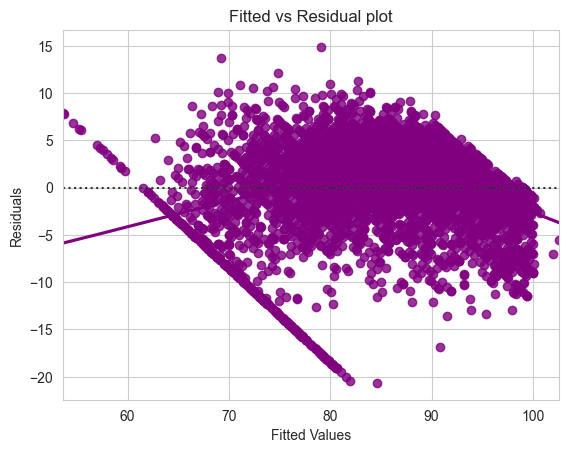

In [72]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

* We can observe a pattern in the residual vs fitted values, hence we will try to transform the continous variables in the data.

In [73]:
x_train_const.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap', 'runqsz'],
      dtype='object')

<IPython.core.display.Javascript object>

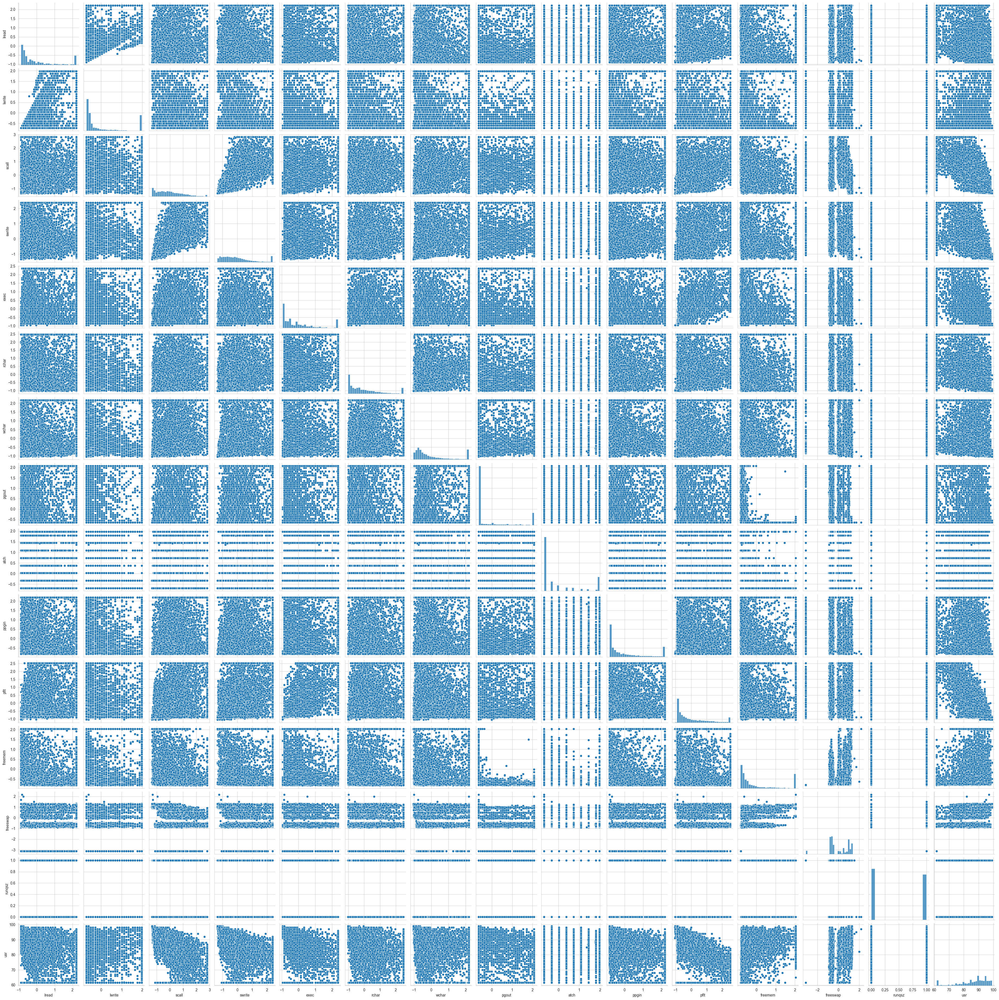

In [74]:

sns.pairplot(df_scaled[['lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap', 'runqsz', 'usr']]);

#['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap', 'runqsz', 'usr']

* No scope to transform any variable, let's keep it same and assume the LInearity test qualified

#### Normality Test

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

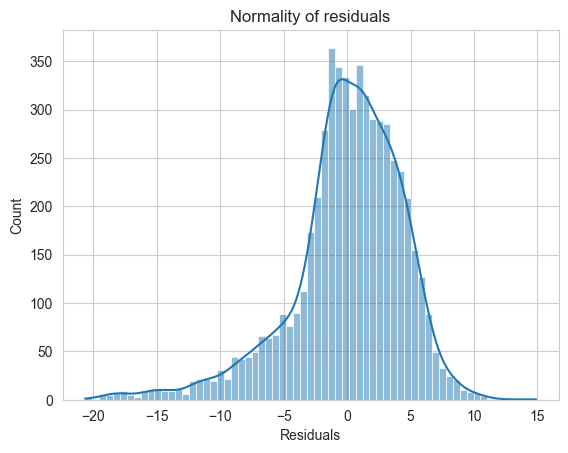

In [75]:
sns.histplot(df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()

<IPython.core.display.Javascript object>

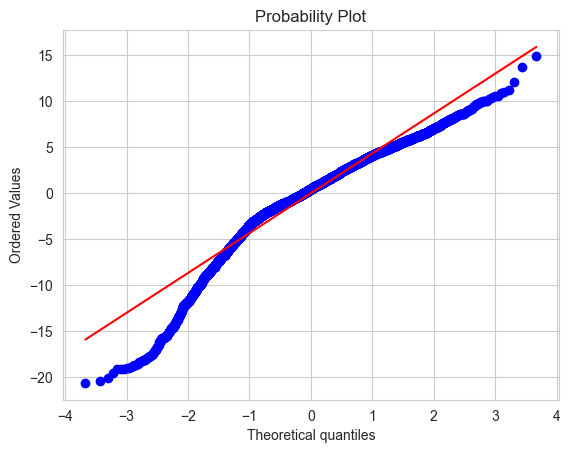

In [76]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

The Shapiro-Wilk test can also be used for checking the normality. The null and alternate hypotheses of the test are as follows:

* Null hypothesis - Data is normally distributed.
* Alternate hypothesis - Data is not normally distributed.

In [77]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9422272443771362, pvalue=1.2303400516771894e-42)

* Since p-value < 0.05, the residuals are not normal as per shapiro test.
* Strictly speaking - the residuals are not normal. 

### Homoscedesticity Test

The null and alternate hypotheses of the goldfeldquandt test are as follows:

* Null hypothesis : Residuals are homoscedastic
* Alternate hypothesis : Residuals have hetroscedasticity

In [78]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [79]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], x_train_const)
lzip(name, test)

[('F statistic', 1.017849170172746), ('p-value', 0.31833438073798037)]

* Since p-value > 0.05 we can say that the residuals are homoscedastic.

### All assumptions of LR are satisfied. Let's check final model

In [80]:
res_15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1535.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        11:37:21   Log-Likelihood:                -16720.
No. Observations:                5734   AIC:                         3.347e+04
Df Residuals:                    5719   BIC:                         3.357e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.0701      0.084   1034.666      0.000      86.905      87.235
lread         -1.0691      0.133     -8.037      0.000      -1.330      -0.808
lwrite         0.5327      0.121      4.413      0.000       0.296       0.769
scall         -1.0092      0.097    -10.443      0.000      -1.199      -0.820
swrite        -0.5159      0.102     -5.045      0.000      -0.716      -0.315
exec          -0.6940      0.099     -7.014      0.000      -0.888      -0.500
rchar         -0.8199      0.076    -10.775      0.000      -0.969      -0.671
wchar         -0.3864      0.074     -5.188      0.000      -0.532      -0.240
pgout         -0.7759      0.085     -9.163      0.000      -0.942      -0.610
atch           0.3730      0.081      4.599      0.000       0.214       0.532
ppgin         -0.6830      0.073     -9.369      0.000      -0.826      -0.540
pflt          -4.0680      0.110    -37.105      0.000      -4.283      -3.853
freemem       -0.7660      0.083     -9.247      0.000      -0.928      -0.604
freeswap       3.8449      0.079     48.763      0.000       3.690       3.999
runqsz        -1.6711      0.127    -13.172      0.000      -1.920      -1.422
==============================================================================
Omnibus:                     1051.276   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2241.320
Skew:                          -1.073   Prob(JB):                         0.00
Kurtosis:                       5.186   Cond. No.                         6.54
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

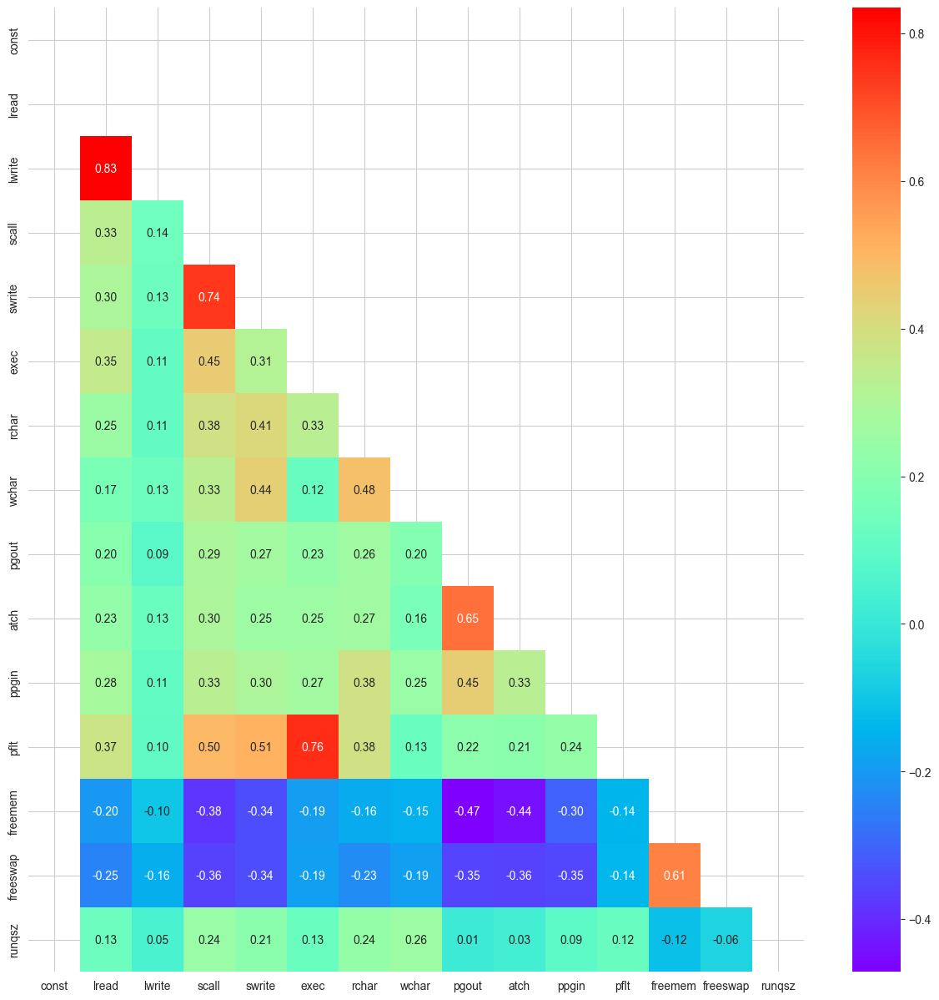

In [81]:
plt.figure(figsize=(15,15))
sns.heatmap(x_train_const.corr(), annot=True, fmt='.2f', cmap='rainbow', mask=np.triu(x_train_const.corr()));

In [82]:
vif_series_final = pd.Series(
    [variance_inflation_factor(x_train_const.values, i) for i in range(x_train_const.shape[1])],
    index=x_train_const.columns,
)
print("VIF values: \n\n{}\n".format(vif_series_final))

<IPython.core.display.Javascript object>

VIF values: 

const       2.028821
lread       5.127749
lwrite      4.216236
scall       2.678920
swrite      3.007403
exec        2.810496
rchar       1.668190
wchar       1.572037
pgout       2.058686
atch        1.864191
ppgin       1.519383
pflt        3.463900
freemem     1.951170
freeswap    1.762861
runqsz      1.149244
dtype: float64



### Linear Regression from Sklearn

In [83]:
from sklearn.linear_model import LinearRegression

In [84]:
x_train_const.head()

,const,lread,lwrite,scall,swrite,exec,rchar,wchar,pgout,atch,ppgin,pflt,freemem,freeswap,runqsz
2912,1.0,-0.753545,-0.608895,1.385764,0.319450,-0.853740,0.072265,2.174900,-0.464021,-0.689780,0.507118,-0.882744,0.177730,-0.779668,1
818,1.0,-0.819513,-0.608895,-1.199302,-0.843869,-0.853740,0.570866,2.174900,-0.645830,-0.689780,0.077020,-0.880774,2.037473,1.190878,1
6510,1.0,-0.819513,-0.716521,-0.675760,-0.668856,-0.262062,0.533897,-0.581565,-0.645830,-0.689780,-0.711493,-0.469124,-0.481187,0.488883,1
6762,1.0,2.215024,1.220759,1.341821,0.865077,2.351183,1.188943,-0.526386,2.081298,1.974981,1.845798,2.519770,-0.781996,-0.845687,1
7576,1.0,0.697756,0.897879,0.773710,0.247386,0.329616,0.291124,-0.336893,-0.554925,-0.334479,0.184545,0.058733,-0.815004,-3.131333,1


In [85]:
x_train.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz
2912,-0.753545,-0.608895,1.385764,0.383125,0.319450,-0.853341,-0.853740,0.072265,2.174900,-0.464021,-0.436134,-0.554799,-0.689780,0.808795,0.507118,-0.882744,-0.440789,0.177730,-0.779668,1
818,-0.819513,-0.608895,-1.199302,-0.332377,-0.843869,-0.853341,-0.853740,0.570866,2.174900,-0.645830,-0.634297,-0.635071,-0.689780,-0.128223,0.077020,-0.880774,-0.855591,2.037473,1.190878,1
6510,-0.819513,-0.716521,-0.675760,-0.843451,-0.668856,-0.601947,-0.262062,0.533897,-0.581565,-0.645830,-0.634297,-0.635071,-0.689780,-0.726874,-0.711493,-0.469124,-0.716503,-0.481187,0.488883,1
6762,2.215024,1.220759,1.341821,2.512598,0.865077,2.100548,2.351183,1.188943,-0.526386,2.081298,1.966599,1.873437,1.974981,2.228963,1.845798,2.519770,2.374204,-0.781996,-0.845687,1
7576,0.697756,0.897879,0.773710,0.478526,0.247386,0.026540,0.329616,0.291124,-0.336893,-0.554925,-0.535215,-0.554799,-0.334479,0.366314,0.184545,0.058733,1.275040,-0.815004,-3.131333,1


In [86]:
lr_1 = LinearRegression().fit(x_train, y_train)

In [87]:
lr_train_pred_1 = lr_1.predict(x_train)
lr_test_pred_1 = lr_1.predict(x_test)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, lr_train_pred_1)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, lr_test_pred_1)))
print('MAE on Train Data - ', mean_absolute_error(y_train, lr_train_pred_1))
print('MAE on Test Data - ', mean_absolute_error(y_test, lr_test_pred_1))
print('r2_score on Train Data - ',r2_score(y_train, lr_train_pred_1))
print('r2_score on Test Data - ',r2_score(y_test, lr_test_pred_1))
# print('score on Train data - ', lr_1.score(x_train,y_train))
# print('score on Test data - ', lr_1.score(x_test,y_test))

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.45952981974185


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.5573623477412895
MAE on Train Data -  3.305951266951323
MAE on Test Data -  3.3517567565399378
r2_score on Train Data -  0.7906253799555659
r2_score on Test Data -  0.7816325347351171


In [88]:
lr_2 = LinearRegression().fit(x_train_const, y_train)
lr_train_pred_2 = lr_2.predict(x_train_const)
lr_test_pred_2 = lr_2.predict(x_test_const)

print('RMSE on Train Data -',np.sqrt(mean_squared_error(y_train, lr_train_pred_2)))
print('RMSE on Test Data -',np.sqrt(mean_squared_error(y_test, lr_test_pred_2)))
print('MAE on Train Data - ', mean_absolute_error(y_train, lr_train_pred_2))
print('MAE on Test Data - ', mean_absolute_error(y_test, lr_test_pred_2))
print('r2_score on Train Data - ',r2_score(y_train, lr_train_pred_2))
print('r2_score on Test Data - ',r2_score(y_test, lr_test_pred_2))

<IPython.core.display.Javascript object>

RMSE on Train Data - 4.46793585665482


<IPython.core.display.Javascript object>

RMSE on Test Data - 4.5712896199395985
MAE on Train Data -  3.308276319851029
MAE on Test Data -  3.3658188278696723
r2_score on Train Data -  0.7898353103153941
r2_score on Test Data -  0.7802958360324066


In [89]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,NaN,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,NaN,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,NaN,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
